*Basic SDM*

In [ ]:
import torch
from diffusers import StableDiffusionPipeline

pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16)
pipe = pipe.to("cuda")

prompt = "a photo of an astronaut riding a horse on mars"
image = pipe(prompt).images[0]

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

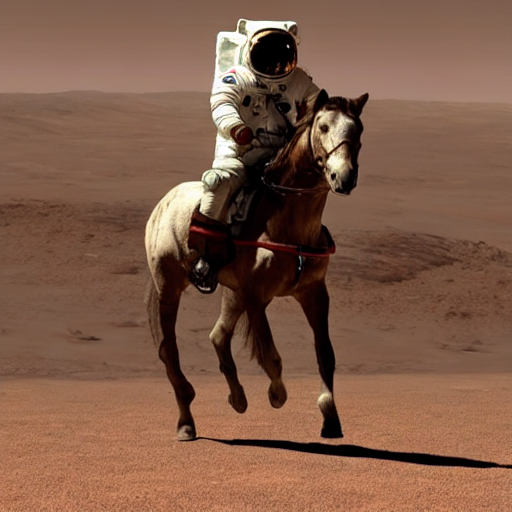

In [ ]:
image

/usr/local/lib/python3.11/dist-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py:894: FutureWarning: `callback` is deprecated and will be removed in version 1.0.0. Passing `callback` as an input argument to `__call__` is deprecated, consider using `callback_on_step_end`
  deprecate(
/usr/local/lib/python3.11/dist-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py:900: FutureWarning: `callback_steps` is deprecated and will be removed in version 1.0.0. Passing `callback_steps` as an input argument to `__call__` is deprecated, consider using `callback_on_step_end`
  deprecate(


  0%|          | 0/50 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py:594: FutureWarning: The decode_latents method is deprecated and will be removed in 1.0.0. Please use VaeImageProcessor.postprocess(...) instead
  deprecate("decode_latents", "1.0.0", deprecation_message, standard_warn=False)


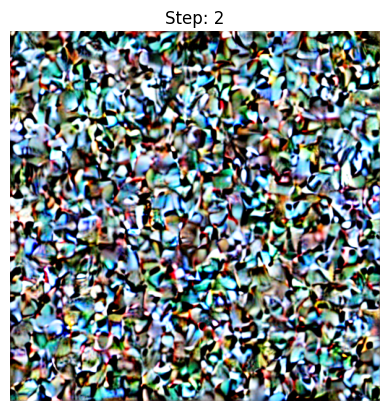

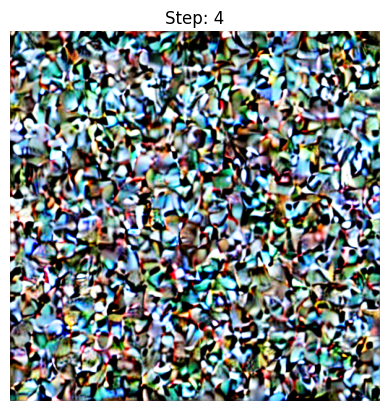

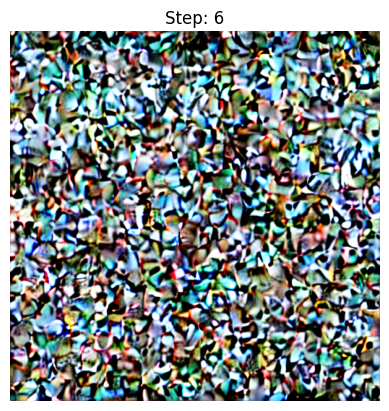

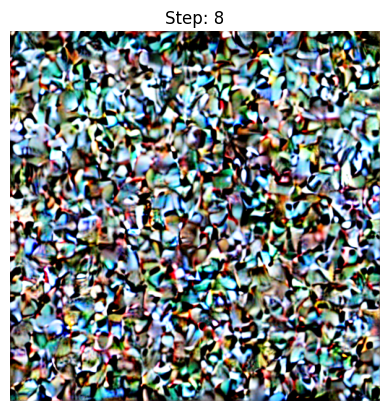

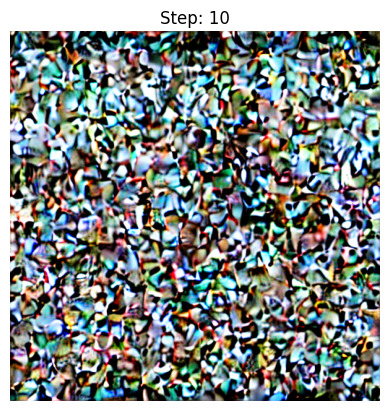

...

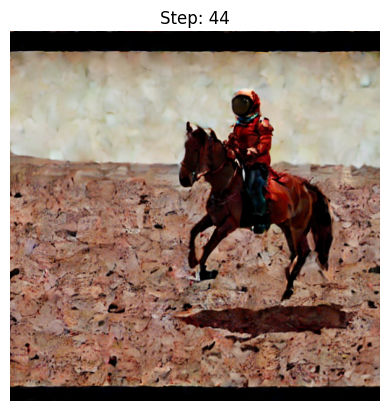

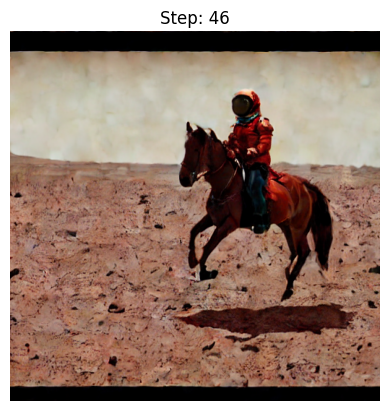

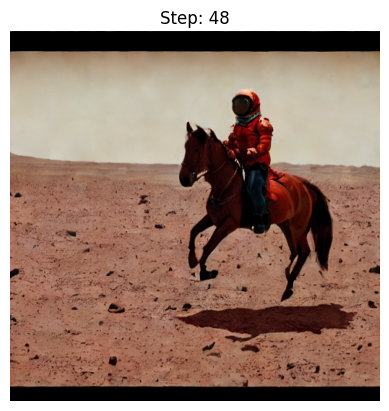

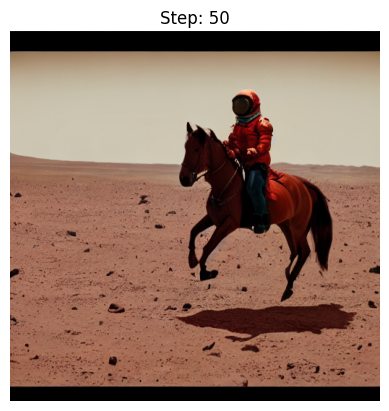

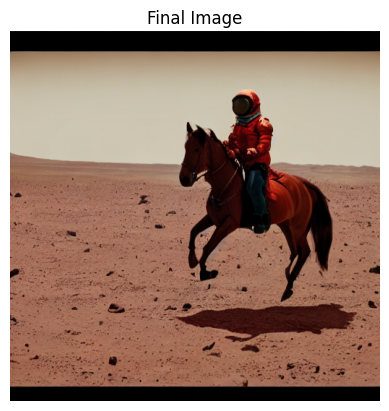

In [ ]:
# import torch
# from diffusers import StableDiffusionPipeline, DDIMScheduler
from PIL import Image
import matplotlib.pyplot as plt

# # Load the pipeline
# pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16)
# pipe = pipe.to("cuda")

# # Switch to DDIMScheduler for finer control over steps
# pipe.scheduler = DDIMScheduler.from_config(pipe.scheduler.config)

# # Define prompt
# prompt = "a photo of an astronaut riding a horse on mars"

# List to store intermediate images
saved_images = []

# Custom callback function to save images during inference
def save_intermediate_images(step, timestep, latents):
    if step % 2 == 0:  # Save every K steps
        with torch.no_grad():
            # Decode the latents to an image
            image = pipe.decode_latents(latents)
            pil_image = pipe.numpy_to_pil(image)[0]

            # Save to list
            saved_images.append(pil_image)

            # Display the image
            plt.imshow(pil_image)
            plt.axis("off")
            plt.title(f"Step: {step}")
            plt.show()

# Generate the image with intermediate steps
image = pipe(
    prompt,
    num_inference_steps=50,  # Total steps
    guidance_scale=7.5,  # Optional, for classifier-free guidance
    callback=save_intermediate_images,  # Add callback
    callback_steps=1,  # Frequency of calling the callback
).images[0]

# Display final image
plt.imshow(image)
plt.axis("off")
plt.title("Final Image")
plt.show()

# Saved images are stored in the `saved_images` list


In [68]:
from sklearn.cluster import KMeans
import cv2
import numpy as np
from PIL import Image

def compute_dominant_colors(image, k=5, color_space='RGB'):
    # Convert PIL.Image.Image to NumPy array (OpenCV uses BGR format by default)
    image = np.array(image)
    if image.ndim == 2:  # Handle grayscale images
        image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)

    # Ensure the image is in BGR format for OpenCV processing
    if image.shape[-1] == 4:  # Handle RGBA images
        image = cv2.cvtColor(image, cv2.COLOR_RGBA2BGR)
    elif image.shape[-1] == 3 and color_space == 'RGB':
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    # Convert to specified color space
    if color_space == 'HSV':
        image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    elif color_space == 'Lab':
        image = cv2.cvtColor(image, cv2.COLOR_BGR2Lab)
    else:  # Default to RGB
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Reshape image into 2D array of pixels
    pixels = image.reshape(-1, 3)

    # Apply K-Means clustering
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(pixels)

    # Get dominant colors and proportions
    dominant_colors = kmeans.cluster_centers_
    proportions = np.bincount(kmeans.labels_) / len(kmeans.labels_)

    return dominant_colors, proportions



In [69]:
metric1 = []

for img in saved_images:
  #print(type(img))
      metric1.append(compute_dominant_colors(img))

In [70]:
len(metric1)

25

In [72]:
for index in range(len(metric1)):
   print("timestep", index*2  ,"---------")
   print(metric1[index][0])
   print("\n")
   print(metric1[index][1])
   print("---------")


timestep 0 ---------
[[216.89757417 234.39253003 236.94886175]
 [ 75.95304911  83.05973538  78.55758602]
 [ 95.73808165 167.26648468 201.77056707]
 [172.11750778 153.01360095 122.86616558]
 [ 13.88873509  11.48352278  10.8810872 ]]


[0.22996902 0.20488739 0.15407944 0.13827896 0.27278519]
---------
timestep 2 ---------
[[217.02905325 233.82850489 236.38747027]
 [ 77.44026516  82.01852748  76.53999702]
 [ 95.80679884 165.37411134 199.27345549]
 [173.50855006 152.37147413 121.66082916]
 [ 13.81691676  11.30509682  10.6001481 ]]


[0.23062134 0.20481491 0.15285873 0.13856125 0.27314377]
---------
timestep 4 ---------
[[219.16764442 233.93937345 235.68739962]
 [ 14.75835532  11.60055244  10.49011928]
 [ 77.02177308  83.26746867  78.49557473]
 [174.73505915 150.05118998 117.60590118]
 [101.51162389 168.34955577 199.83097236]]


[0.22620392 0.27707672 0.20491791 0.13722229 0.15457916]
---------
timestep 6 ---------
[[217.87357356 233.21641928 235.56231363]
 [ 14.17745764  11.40340564  10.42

In [74]:
for index in range(len(metric1)):
   print("timestep", index*2  ,"---------")
   print(metric1[9][0] - metric1[index][0])
   print("\n")
   print(metric1[9][1] - metric1[index][1])
   print("---------")

timestep 0 ---------
[[ 1.28935615e+00 -5.44234199e+00 -5.96259165e+00]
 [ 1.95122555e+01 -6.56057334e+00 -1.51846080e+01]
 [ 8.83923024e+01 -1.42718339e+01 -8.02545067e+01]
 [-6.81938287e+01  6.40019405e-01  5.56725338e+01]
 [ 4.19981516e-01 -7.00489382e-02  2.02389093e-01]]


[ 0.0024147  -0.00218582 -0.00396729 -0.00347137  0.00720978]
---------
timestep 2 ---------
[[  1.15787707  -4.87831684  -5.40120017]
 [ 18.02503943  -5.51936545 -13.16701896]
 [ 88.32358524 -12.37946057 -77.75739515]
 [-69.584871     1.28214622  56.87787018]
 [  0.49179985   0.10837702   0.4833282 ]]


[ 0.00176239 -0.00211334 -0.00274658 -0.00375366  0.0068512 ]
---------
timestep 4 ---------
[[  -0.98071411   -4.9891854    -4.70112952]
 [  80.70694926   64.8986096    52.88285878]
 [ 107.108611     69.72718211   43.02048561]
 [ -70.81138009    3.60243037   60.93279816]
 [ -87.20290728 -156.93608193 -188.74749606]]


[ 0.00617981 -0.07437515 -0.05480576 -0.0024147   0.1254158 ]
---------
timestep 6 ---------
[

In [56]:
from PIL import Image
import numpy as np
from scipy.spatial.distance import directed_hausdorff

def compute_hausdorff_distance(image1, image2):
    # Convert PIL images to numpy arrays (grayscale)
    image1_array = np.array(image1.convert("L"))
    image2_array = np.array(image2.convert("L"))

    # Binarize the images (using a threshold to convert to black and white)
    # Adjust the threshold as needed for your images
    threshold = 128
    image1_binary = (image1_array > threshold).astype(np.uint8)
    image2_binary = (image2_array > threshold).astype(np.uint8)

    # Get coordinates of non-zero points (edges or features in the binary image)
    points1 = np.argwhere(image1_binary > 0)
    points2 = np.argwhere(image2_binary > 0)

    # Compute Hausdorff distance (both directions)
    forward_distance = directed_hausdorff(points1, points2)[0]
    reverse_distance = directed_hausdorff(points2, points1)[0]

    # The final Hausdorff distance is the maximum of the two
    hausdorff_distance = max(forward_distance, reverse_distance)

    return hausdorff_distance


In [63]:
HF_dist = []
for img in saved_images:
  #print(type(img))
  HF_dist.append(compute_hausdorff_distance(img, saved_images[len(saved_images)-1]))

In [64]:
len(HF_dist)

25

In [65]:
HF_dist

[38.47076812334269,
 38.47076812334269,
 38.47076812334269,
 38.47076812334269,
 38.47076812334269,
 38.47076812334269,
 38.47076812334269,
 38.47076812334269,
 38.47076812334269,
 38.47076812334269,
 38.47076812334269,
 38.47076812334269,
 38.47076812334269,
 38.47076812334269,
 38.47076812334269,
 38.01315561749642,
 38.01315561749642,
 37.57658845611187,
 33.24154027718932,
 29.0,
 29.0,
 17.08800749063506,
 17.029386365926403,
 12.041594578792296,
 0.0]

In [66]:
percentage_hf = []
for metric_score in HF_dist:
  percentage_hf.append(100-(metric_score/HF_dist[0])*100)


In [67]:
percentage_hf

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 1.1895070677536097,
 1.1895070677536097,
 2.3243093674759763,
 13.592730536046815,
 24.61808948804473,
 24.61808948804473,
 55.58183960390781,
 55.734217961731886,
 68.69936534621495,
 100.0]

In [75]:
from skimage.feature import local_binary_pattern
import numpy as np
from PIL import Image
import cv2

def compute_lbp_features(image: Image.Image, num_points=8, radius=1, method='uniform'):
    # Convert PIL Image to a NumPy array
    image_np = np.array(image)

    # Convert the image to grayscale
    gray = cv2.cvtColor(image_np, cv2.COLOR_RGB2GRAY)

    # Compute LBP
    lbp = local_binary_pattern(gray, num_points, radius, method)

    # Compute the histogram
    hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, num_points + 3), range=(0, num_points + 2))
    hist = hist.astype("float")

    # Normalize the histogram
    hist /= (hist.sum() + 1e-6)

    return hist


In [76]:
LBP = []
for img in saved_images:
  #print(type(img))
  LBP.append(compute_lbp_features(img))

In [77]:
LBP

[array([0.01164246, 0.02981567, 0.04214859, 0.17367172, 0.36058807,
        0.15036774, 0.03897858, 0.02520752, 0.13420105, 0.0333786 ]),
 array([0.01160049, 0.02983093, 0.04236221, 0.17328644, 0.3604126 ,
        0.15021515, 0.03897858, 0.02534103, 0.13463974, 0.03333282]),
 array([0.01145935, 0.02994156, 0.04236603, 0.17311478, 0.36055756,
        0.15026855, 0.03900528, 0.0251236 , 0.13515854, 0.03300476]),
 array([0.0114212 , 0.03004456, 0.04219818, 0.1734314 , 0.36040497,
        0.14981079, 0.03916931, 0.025177  , 0.13519669, 0.0331459 ]),
 array([0.01158905, 0.03009033, 0.04232025, 0.17346954, 0.3599205 ,
        0.14968872, 0.03892517, 0.02528763, 0.13545609, 0.03325272]),
 array([0.01165771, 0.0297966 , 0.04224396, 0.17353439, 0.35960007,
        0.14952087, 0.03942871, 0.0254097 , 0.13545227, 0.03335571]),
 array([0.01178741, 0.02995682, 0.04244614, 0.17308426, 0.35905838,
        0.14965057, 0.03966904, 0.02522659, 0.13537598, 0.03374481]),
 array([0.01193619, 0.0302124 , 0.

*after LoRa fine tuning*